In [1]:
import utils
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import librosa
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display
from filters import generate_filter, preprocess_v1


In [2]:
class FastThumbnail(nn.Module):
    def __init__(self, dims, filter_sd=0.1, n_layers=1, pad_param=0.1, n_channels=10):
        super().__init__()
        self.low = dims[0]
        self.high = dims[1]
        self.filter_sd = filter_sd
        self.n_layers = n_layers
        self.pad_param = pad_param
        self.n_channels = n_channels

        self.filterbank = self.create_filterbank_v2()

    def create_filterbank_v2(self):
        F = generate_filter(self.high, self.filter_sd)
        filter_list = []
        for ix in range(self.low, self.high):
            f = F.clone()
            k = (self.high-ix)//2
            f = f[k:k+ix, k:k+ix]
            filter_list.append(f)

        return filter_list

    def compute_pooled_features(self, S):
        pooled_features = []
        for ix in range(self.n_layers):
            if ix==0:
                sub_S = S
            else:
                sub_S = F.avg_pool2d(S, kernel_size=ix+1, stride=1)
                
            print(sub_S.shape)
            pooled_features.append(sub_S)

        
#         return nn.ParameterList(pooled_features)
        return pooled_features
    
    def compute_coverage(self, conv_out, idxs):
        coverage = torch.stack([conv_out[idxs[i],:,i] for i in range(len(idxs))])
        cov_clean = coverage
        cov_clean[cov_clean <= torch.median(coverage)] = 0.0
        cov_clean /= (2**0.5)
        cov_scores = torch.sum(cov_clean,dim=1)/((1+self.pad_param)*cov_clean.shape[-1])
        return cov_scores


    def forward(self, S):
        t1 = time.time()
        S = preprocess_v1(S, pad_param=self.pad_param, n_channels=self.n_channels)
        t2 = time.time()
        print(f'Preprocess time: {t2 - t1}')
        # assert self.high < S.shape[-1]
        input_features = self.compute_pooled_features(S)
        cov_scores = []
        rep_scores = []

        with torch.no_grad():
            for filter in tqdm(self.filterbank):
                kernel = filter.view(1, 1, filter.shape[0], -1).repeat(self.n_channels, 1, 1, 1)
                kernel = kernel
                for feature in input_features:
                    output = F.conv2d(feature, kernel, stride=(kernel.shape[-1],1), groups=self.n_channels).squeeze(0)
                    channel_score = output.sum(dim=-2)
                    rep = torch.max(channel_score,dim=-2).values
                    max_idxs = torch.max(channel_score,dim=-2).indices
                    cov = self.compute_coverage(conv_out=output, idxs=max_idxs)
                    cov_scores.append(cov)
                    rep_scores.append(rep)        

        return cov_scores, rep_scores   
        


/tmp/ipykernel_7721/2400405532.py:2: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(fpath, sr=22050)
/home/aditya/anaconda3/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


(12, 2340)


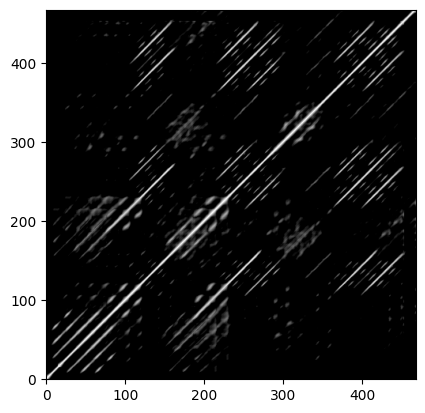

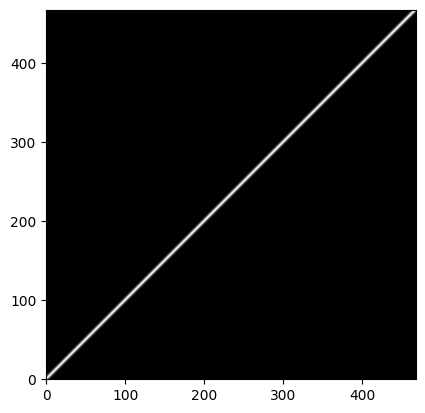

In [47]:
fpath = '../Downloads/adele1.m4a'
y, sr = librosa.load(fpath, sr=22050)
X, S = utils.compute_sm_from_audio(y)

plt.imshow(S,origin='lower',cmap='gray')
plt.show()
plt.imshow(generate_filter(S.shape[0], 0.5), origin='lower',cmap='gray')
plt.show()

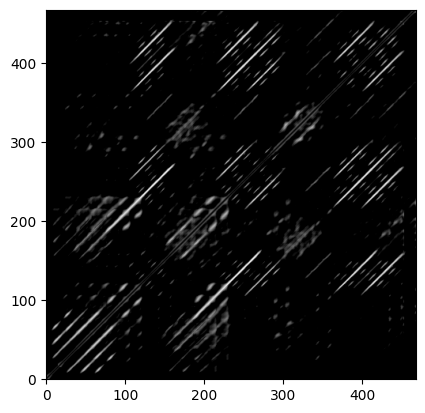

In [32]:
f = generate_filter(S.shape[0], 0.5)
plt.imshow(np.multiply(S,1-f), origin='lower',cmap='gray')


In [45]:
# S = torch.from_numpy(S)
t1 = time.time()
net = FastThumbnail(dims=(3,int(S.shape[0]- 20)), pad_param=0.0, filter_sd=0.5, n_channels=1)
print(time.time() - t1)
scores = net(S)
print()
print(time.time() - t1)

0.6817336082458496
Preprocess time: 0.6971426010131836
torch.Size([1, 1, 468, 468])


100%|████████████████████████████████████████| 445/445 [00:01<00:00, 231.18it/s]


3.3054099082946777


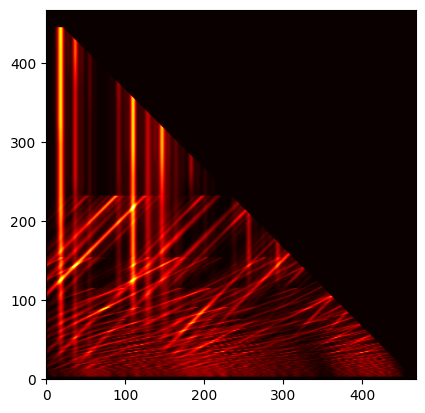

In [46]:
cov, rep = scores
# fitness = [hmean(np.vstack(x)) for x in zip(cov,rep)]
fitness = rep
# Compute scape plot
low = S.shape[0] - len(fitness[0]) + 1

scape = np.zeros((S.shape[0],S.shape[1]))
for iy in range(len(fitness)):
    if iy < low:
        continue
    # pad = (S.shape[0] - len(fitness[iy])) / 2
    # scape[iy, int(np.floor(pad)) : -int(np.ceil(pad))] = fitness[iy]
    pad = S.shape[0] - len(fitness[iy])
    scape[iy,: -int(np.ceil(pad))] = fitness[iy]
    
plt.imshow(scape, cmap='hot', origin='lower')

In [43]:
def get_thumbnail(audio, score_matrix, rate, fs=22050):
    # rate = 10 / H
    id = np.unravel_index(score_matrix.argmax(), score_matrix.shape)
    s = int(id[1]*fs/rate)
    thumbnail = audio[s : s + int(id[0]*fs/rate) + 1]
    print(id)
    display(Audio(thumbnail, rate=fs))

In [44]:
get_thumbnail(y, scape, rate=2)

(192, 10)


In [10]:
display(Audio(y, rate=22050))